# **Visualization of CNNs: Grad-CAM**
* **Objective**: Convolutional Neural Networks are widely used on computer vision. They are powerful for processing grid-like data. However we hardly know how and why they work, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.


* NB: if `PIL` is not installed, try `conda install pillow`.
* Computations are light enough to be done on CPU.

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request

import numpy as np
from PIL import Image

# other imports
from tqdm import trange
import textwrap

device = "cuda" # SPECIFY YOUR DEVICE

%matplotlib inline

## Download the Model
We provide you with a model `DenseNet-121`, already pretrained on the `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **DenseNet-121**: A deep architecture for image classification (https://arxiv.org/abs/1608.06993)

In [2]:
densenet121 = models.densenet121(pretrained=True)
densenet121.eval() # set the model to evaluation model
pass

/home/onyxia/work/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/onyxia/work/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /home/onyxia/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 90.0MB/s]


In [3]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl'))

##classes is a dictionary with the name of each class 


## Input Images
We provide you with 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [4]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    # Note: If the inverse normalisation is required, apply 1/x to the above object
    
    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [5]:
import os
if not os.path.exists("data"):
    os.mkdir("data")
if not os.path.exists("data/TP2_images"):
    os.mkdir("data/TP2_images")
    !cd data/TP2_images && wget "https://www.lri.fr/~gcharpia/deeppractice/2025/TP2/TP2_images.zip" && unzip TP2_images.zip

dir_path = "data/" 
dataset = preprocess_image(dir_path)

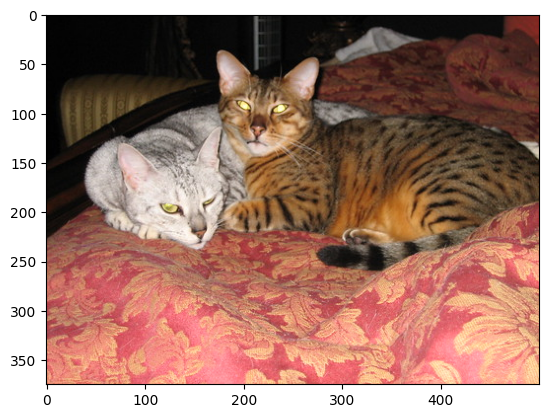

In [6]:
# show the orignal image 
index = 5
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [7]:
input_image = dataset[index][0].view(1, 3, 224, 224)
densenet121.to(device)
output = densenet121(input_image.to(device)).cpu()
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [285 281 282] ['Egyptian cat', 'tabby, tabby cat', 'tiger cat']
Raw class scores: [11.899135 10.017799  9.186234]


# Grad-CAM 
* **Overview:** Given an image, and a category (‘tiger cat’) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude. 

More precisely, you should provide a function: `show_grad_cam(image: torch.tensor) -> None` that displays something like this:
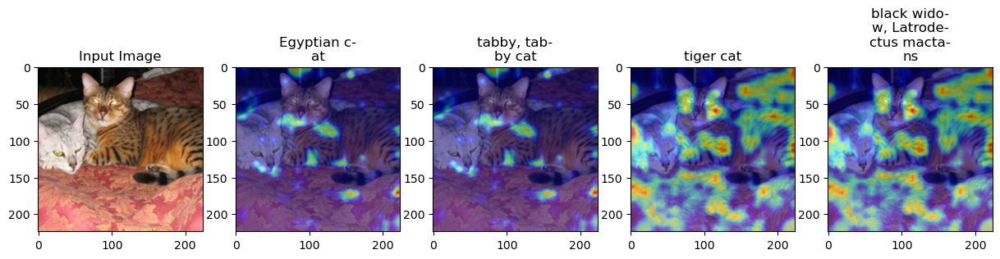
where the heatmap will be correct (here it is just an example) and the first 3 classes are the top-3 predicted classes and the last is the least probable class according to the model.

* **Comment your code**: Your code should be easy to read and follow. Please comment your code, try to use the NumPy Style Python docstrings for your functions.

* **To be submitted within 2 weeks**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (with or without GPU) (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!


* **Hints**: 
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully.
 + More on [autograd](https://pytorch.org/tutorials/beginner/basics/autogradqs_tutorial.html) and [hooks](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks)
 + The pretrained model densenet doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly. 
 + Your heatmap will have the same size as the feature map. You need to scale up the heatmap to the resized image (224x224, not the original one, before the normalization) for better observation purposes. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link to the paper: [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

Class: ‘pug, pug-dog’ | Class: ‘tabby, tabby cat’
- | - 
![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/dog.jpg)| ![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/cat.jpg)

## Part 1: Grad-CAM implementation

In [8]:
model = densenet121

model = model.eval()


In [18]:
class GradCam:
    def __init__(self, model, layer, device="cpu"):
        """
        GradCam as described in the paper (for one specific layer)
        
        :param model (torch model): torch model (densenet121 but should work with an other one if layer is well specified).
        :param layer (torch model): the specific layer for Grad-CAM.
        :param device (str): cpu or cuda.
        """
        self.model = model.to(device)
        self.layer = layer
        self.device = device

    def _gradcam(self, data, cls):
        """
        The important function: apply the gradcam
        :param data (torch.tensor): Image, shape: [1, 3, H, W] (should be normalized).
        :param cls (int): Idx of the class.
        :return: Heatmap sous forme de numpy array.
        """
        activations = []

        def hook_fn(module, input, output):
            activations.append(output)

        hook = self.layer.register_forward_hook(hook_fn)

        data = data.to(self.device)
        out = self.model(data)
        score = out[0, cls]
        grads = torch.autograd.grad(score, activations)
        hook.remove()

        w = grads[0][0].mean(dim=[1, 2])
        sal = torch.matmul(w, activations[0].squeeze(0).view(activations[0].size(1), -1))
        sal = sal.view(activations[0].size(2), activations[0].size(3)).cpu().detach().numpy()
        sal = np.maximum(sal, 0)

        return sal

    @staticmethod
    def _denormalize(img):
        """
        Unnormalize the img (we use it before we want to plot it from the tensor).
        
        :param img (torch.tensor): shape [3, H, W].
        :return: unnormalized image (and permuted !!)
        """
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

        img = img.clone().detach().cpu() * std + mean
        img = torch.clamp(img, 0, 1)
        return img.permute(1, 2, 0).numpy()

    def show_gradcam(self, img, k=3, show_last=True):
        """     
        :param img (torch.tensor): shape [3, H, W].
        :param k (int): number of classes.
        :param show_last (bool): if True, also display the least probable class.
        """
        img = img.to(self.device)
        probs_all = nn.Softmax(dim=1)(self.model(img.unsqueeze(0)))
        probs, clss = torch.topk(probs_all, k)
        image = self._denormalize(img)
        num_plots = k + 2 if show_last else k + 1

        plt.figure(figsize=(12, 3 * num_plots))
        plt.subplot(1, num_plots, 1)
        plt.imshow(image)
        plt.title("Original Img", fontsize=10)
        plt.axis('off')

        for i, (p, c) in enumerate(zip(probs[0], clss[0])):
            plt.subplot(1, num_plots, i + 2)
            sal = self._gradcam(img.unsqueeze(0), c)
            sal = Image.fromarray(sal)
            sal = sal.resize((image.shape[1], image.shape[0]), resample=Image.BILINEAR)

            class_name = "\n".join(textwrap.wrap(classes[c.item()], width=20))
            txt = f"\n{p.item() * 100:.2f}%"
            plt.title(class_name + txt, fontsize=10)
            plt.axis('off')
            plt.imshow(image)
            plt.imshow(np.array(sal), alpha=0.5, cmap='jet')

        if show_last:
            least_prob_class = torch.argmin(probs_all, dim=1).item()
            least_prob = probs_all[0, least_prob_class].item()
            plt.subplot(1, num_plots, num_plots)
            sal = self._gradcam(img.unsqueeze(0), least_prob_class)
            sal = Image.fromarray(sal)
            sal = sal.resize((image.shape[1], image.shape[0]), resample=Image.BILINEAR)

            class_name = "\n".join(textwrap.wrap(classes[least_prob_class], width=20))
            txt = f"\n{least_prob * 100:.2f}%"
            plt.title(f"Least Probable:\n{class_name}" + txt, fontsize=10)
            plt.axis('off')
            plt.imshow(image)
            plt.imshow(np.array(sal), alpha=0.5, cmap='jet')

        plt.tight_layout()
        plt.show()

    def show_examples(self, dataset, n_examples=2, show_last=True):
        """
        Run gradcam on random samples of the dataset.

        :param dataset (torch dataset): dataset of images, return (sample, cls).
        :param n_examples (int): number of examples to show.
        :param show_last (bool): if True, also display the least probable class.
        """
        num_columns = 4 + show_last  # 3 classes + 1 optional least probable class
        plt.figure(figsize=(15, int((5 + show_last) * n_examples)))

        for j in trange(n_examples):
            idx = np.random.choice(len(dataset.imgs))
            image = Image.open(dataset.imgs[idx][0]).convert('RGB')
            sample, _ = dataset[idx]

            probs_all = nn.Softmax(dim=1)(self.model(sample.unsqueeze(0).to(self.device)))
            probs, clss = torch.topk(probs_all, 3)

            plt.subplot(n_examples, num_columns, j * num_columns + 1)
            plt.imshow(image)
            plt.title(f"Original Img", fontsize=10)
            plt.axis('off')

            for i, (p, c) in enumerate(zip(probs[0], clss[0])):

                plt.subplot(n_examples, num_columns, j * num_columns + i + 2)
                sal = self._gradcam(sample.unsqueeze(0), c)
                sal = Image.fromarray(sal)
                sal = sal.resize(image.size, resample=Image.BILINEAR)

                class_name = "\n".join(textwrap.wrap(classes[c.item()], width=35))
                txt = f"\n{p.item() * 100:.2f}%"
                plt.title(class_name + txt, fontsize=10)
                plt.axis('off')
                plt.imshow(image)
                plt.imshow(np.array(sal), alpha=0.5, cmap='jet')

            if show_last:
                least_prob_class = torch.argmin(probs_all, dim=1).item()
                least_prob = probs_all[0, least_prob_class].item()

                plt.subplot(n_examples, num_columns, j * num_columns + num_columns)
                sal = self._gradcam(sample.unsqueeze(0), least_prob_class)
                sal = Image.fromarray(sal)
                sal = sal.resize(image.size, resample=Image.BILINEAR)

                raw_txt = f"Least Probable: {classes[least_prob_class]} ({least_prob * 100:.2f}%)"
                txt = "\n".join(textwrap.wrap(raw_txt, width=35))
                plt.title(txt, fontsize=10)
                plt.axis('off')
                plt.imshow(image)
                plt.imshow(np.array(sal), alpha=0.5, cmap='jet')

        plt.tight_layout()
        plt.show()

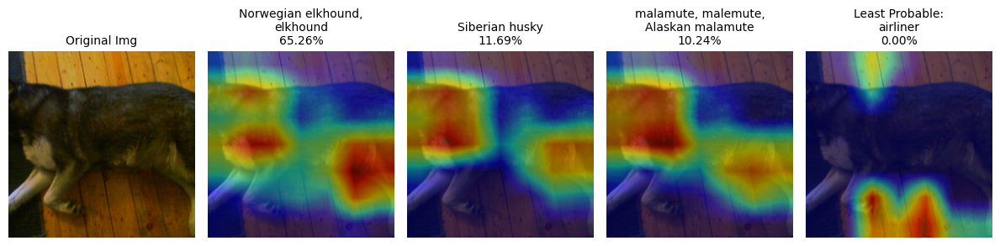

In [ ]:
gradcam = GradCam(model, model.features.denseblock4.denselayer5.conv2, device=device)
gradcam.show_gradcam(dataset[3][0], 3)

## Part 2: Try it on a few (1 to 3) images and comment

100%|██████████| 3/3 [00:00<00:00,  5.51it/s]


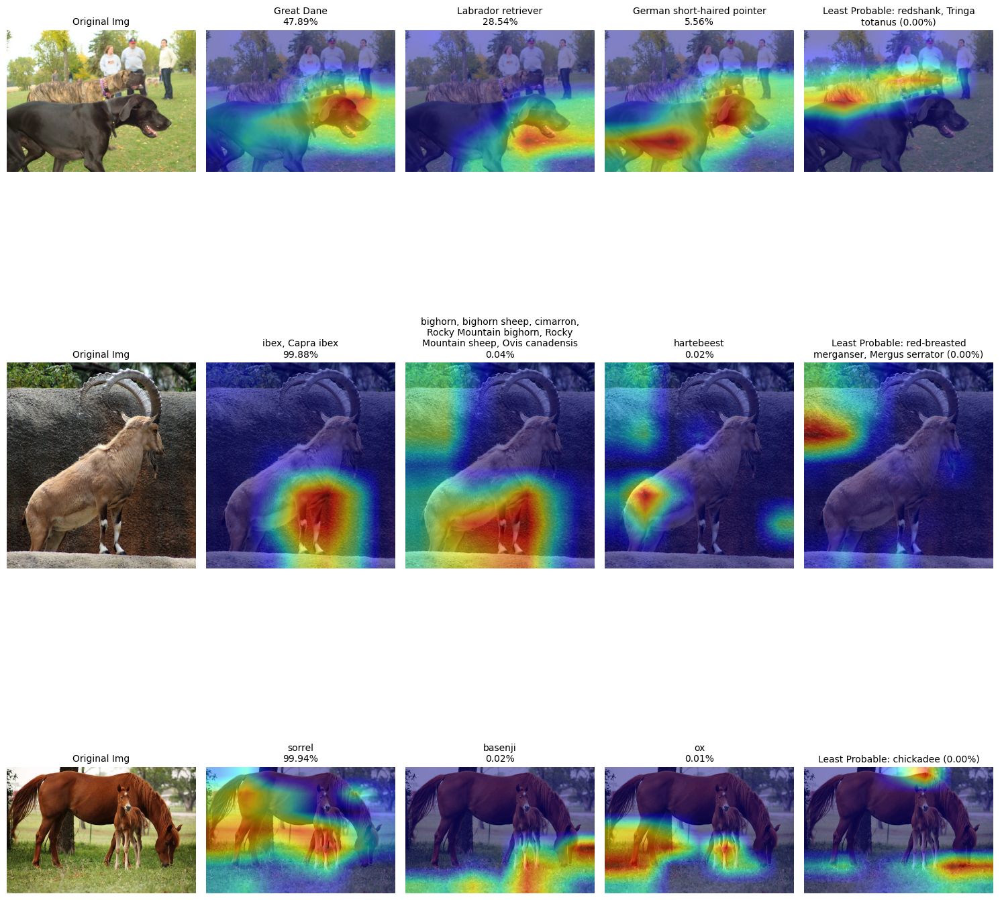

In [22]:
gradcam = GradCam(densenet121, densenet121.features.denseblock4.denselayer5.conv2, device=device)
gradcam.show_examples(dataset, 3)

## Part 3: Try GradCAM on others convolutional layers, describe and comment the results

In [23]:
# As taught in class the first layers usually extract general features while when we go deeper
# the convolutions focus on more specific features. In another paper that i red (patchcore https://arxiv.org/abs/2106.08265)
# that use the latent space for anomaly detection, they say that the last layers are focus on the task of the model
# (here classification). In part 2, we took the last layers for grad cam and the results where not so bad 
# but if we take some layers that come sooner, we might ... #TODO Continuer


# Ill plot several examples for different convolution layers, so we just have to select one of them and do the interpretation...

100%|██████████| 3/3 [00:00<00:00,  3.80it/s]


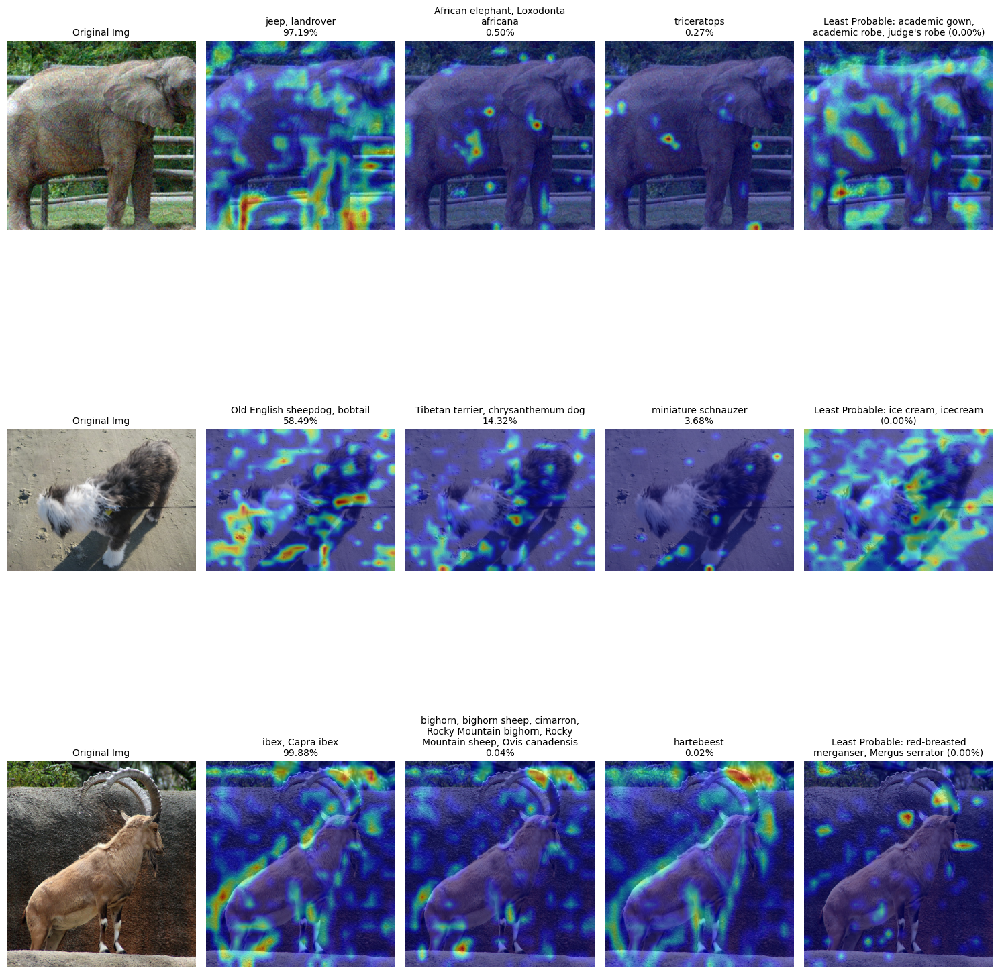

In [24]:
# Block 2 layer 3 conv 2
gradcam = GradCam(densenet121, densenet121.features.denseblock2.denselayer3.conv2, device=device)
gradcam.show_examples(dataset, 3)

100%|██████████| 3/3 [00:00<00:00,  4.00it/s]


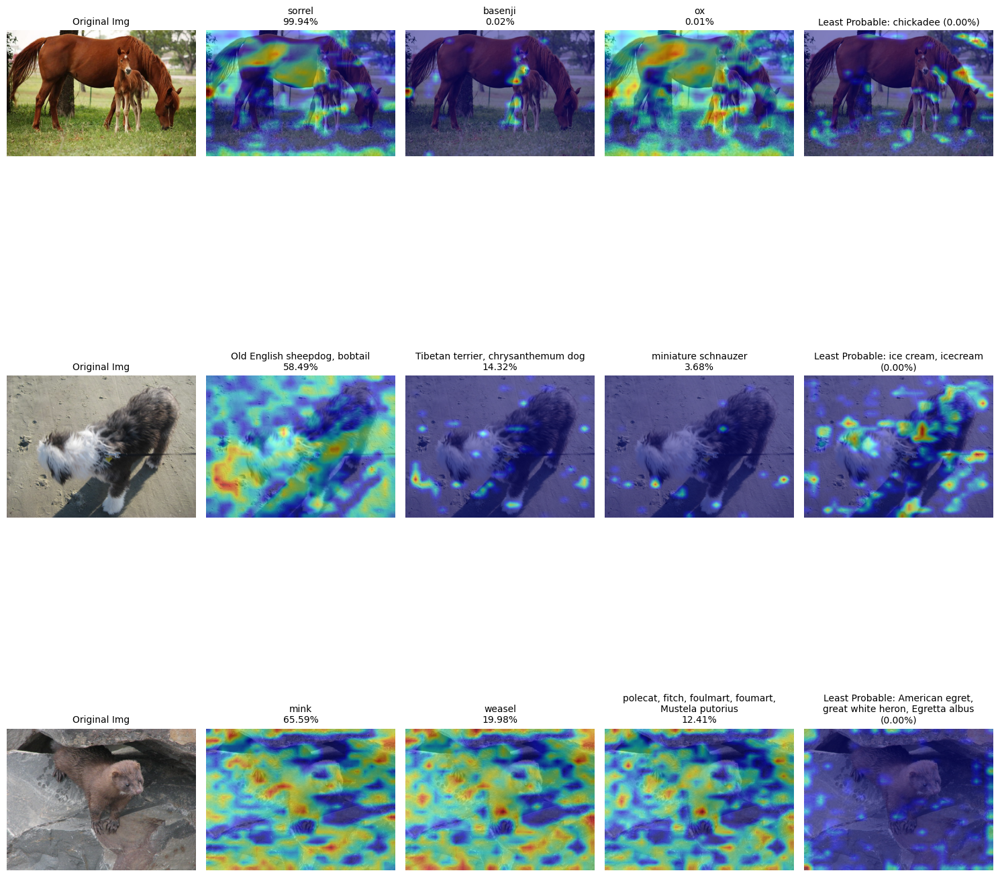

In [25]:
# Block 2 layer 3 conv 1
gradcam = GradCam(densenet121, densenet121.features.denseblock2.denselayer3.conv1, device=device)
gradcam.show_examples(dataset, 3)

100%|██████████| 3/3 [00:00<00:00,  3.68it/s]


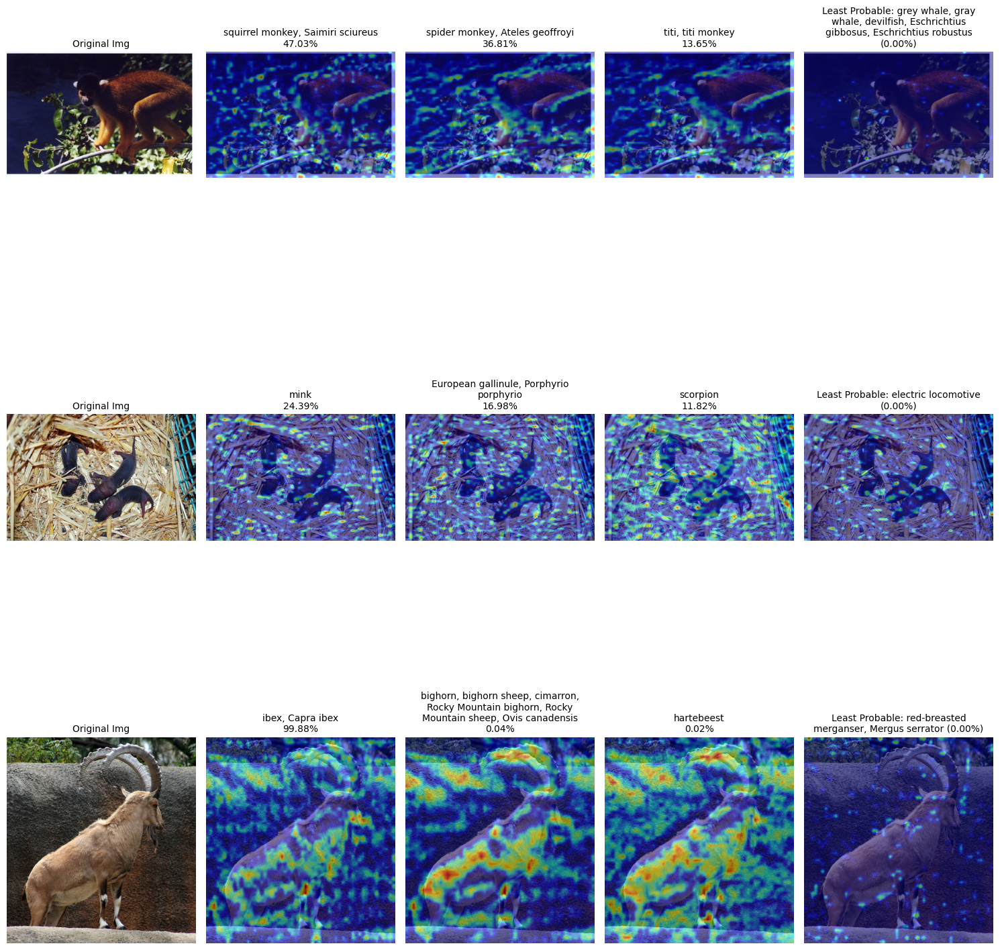

In [26]:
# Block 1 layer 4 conv 2
gradcam = GradCam(densenet121, densenet121.features.denseblock1.denselayer4.conv2, device=device)
gradcam.show_examples(dataset, 3)

100%|██████████| 3/3 [00:00<00:00,  5.05it/s]


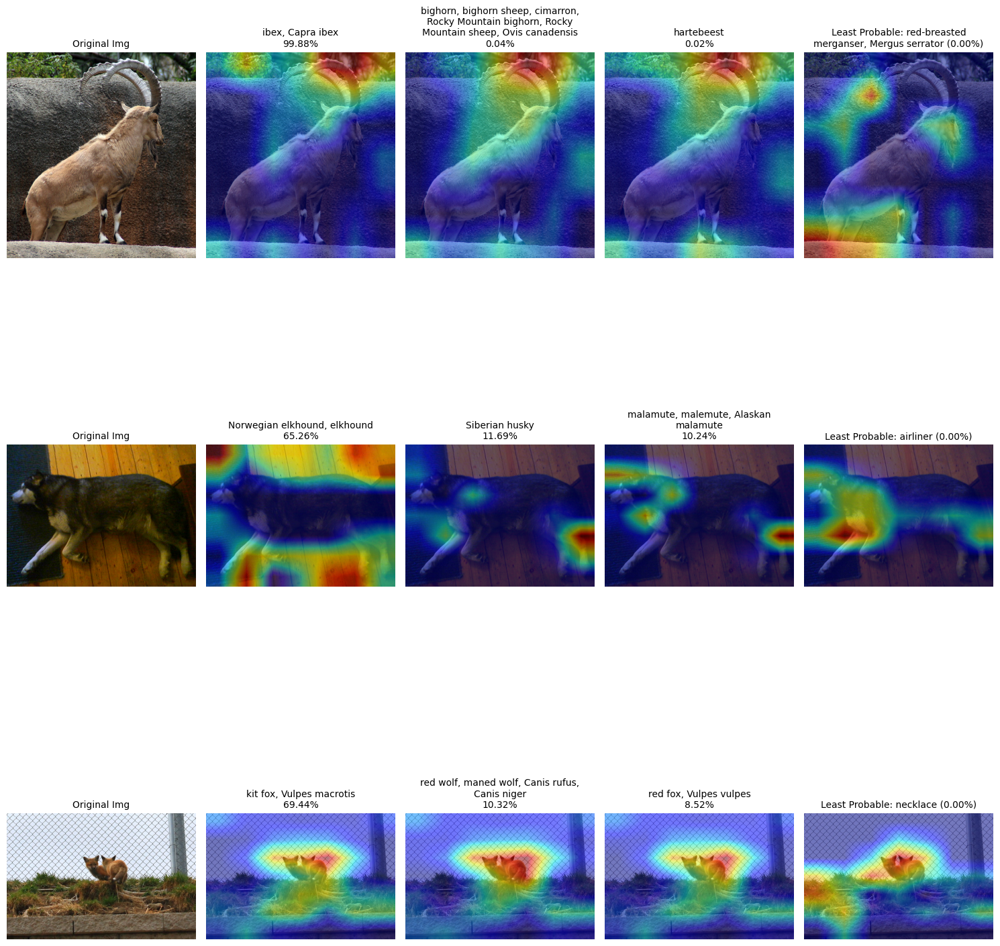

In [27]:
# Block 4 layer 3 conv 1
gradcam = GradCam(densenet121, densenet121.features.denseblock4.denselayer3.conv1, device=device)
gradcam.show_examples(dataset, 3)

## Part 4: Try GradCAM on `9928031928.png` , describe and comment the results

In [28]:
# I havent done this exercise but i bet my arm that this is the picture of the elephant where we dont see his defenses...

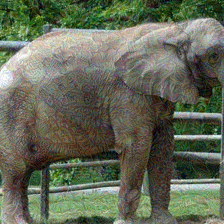

In [29]:
input_image = Image.open("./data/TP2_images/TP2_images/9928031928.png").convert('RGB')
input_image

In [30]:
# Lol

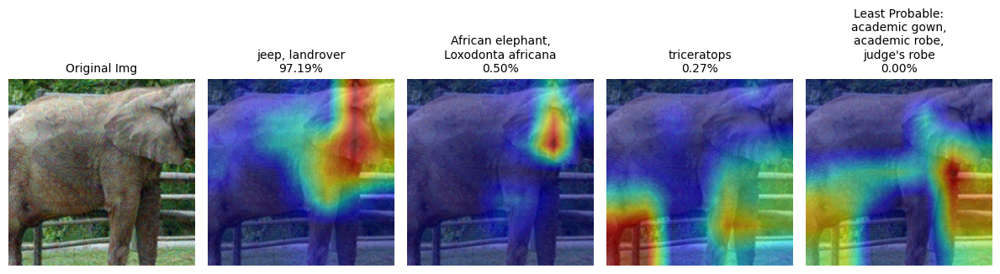

In [31]:
gradcam = GradCam(densenet121, densenet121.features.denseblock4.denselayer5.conv2, device=device)
gradcam.show_gradcam(dataset[-1][0], 3)

## Part 5: What are the principal contributions of GradCAM (the answer is in the paper) ?

## Bonus 5: What are the main differences between DenseNet and ResNet ?